# LIBERO contact-heatmap model — evaluation

Loads a checkpoint produced by `scripts/libero/train_libero_heatmap.py` and evaluates it on the held-out val groups (same group-level split as training, reproduced from the saved config).

Sections:
1. Load run config + checkpoint, rebuild dataset and val split.
2. Run inference, collect predictions + targets.
3. Quantitative metrics: overall log1p MSE, per-task breakdown, per-trial Pearson, peak localization.
4. Qualitative gallery: best / median / worst trials.
5. Per-region Spearman: tests spatial-structure learning without needing per-entity geometry.

In [1]:
import os, sys, json
from pathlib import Path

import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, Subset

REPO_ROOT = Path(os.getcwd()).parent
os.chdir(REPO_ROOT)
sys.path.insert(0, str(REPO_ROOT))

from planner.risk.libero_dataset import LiberoLabelDataset
from planner.risk.libero_model import LiberoHeatmapModel

# Auto-pick the most recent run if not specified.
RUN_DIR = sorted(Path('runs').glob('libero_*'))[-1]
print(f'evaluating run: {RUN_DIR}')
config = json.loads((RUN_DIR / 'config.json').read_text())
for k, v in config.items():
    print(f'  {k}: {v}')

evaluating run: runs/libero_20260512_205644_r7
  splits: ['libero_spatial']
  cache_memmap: False
  image_size: [240, 320]
  val_frac: 0.1
  limit_trials: 0
  use_state: False
  no_holding: False
  holding_mode: film
  per_trial: True
  use_failure_mode: True
  no_pretrained: False
  depth_weight: 0.1
  mass_total_weight: 0.01
  batch_size: 16
  num_workers: 6
  epochs: 50
  lr: 0.001
  weight_decay: 0.0001
  amp: True
  seed: 0
  device: cuda
  output_dir: runs/libero_20260512_205644_r7
  log_every: 0
  n_train: 13500
  n_val: 1500
  n_groups: 5000
  native_hw: [240, 320]
  baseline_val_mass_mse: 0.007515839240815904
  param_count_trainable: 14356035
  started_at: 20260512_205718


## Rebuild dataset + val split (matches training)

In [2]:
def _detect_holding_mode(ckpt_state, cfg):
    """Determine (use_holding, holding_mode, use_failure_mode) for a checkpoint."""
    mode = cfg.get('holding_mode')
    uh = not cfg.get('no_holding', False)
    ufm = bool(cfg.get('use_failure_mode', False))
    if mode in ('bottleneck', 'film'):
        # Explicit from config — also need to detect failure-mode usage.
        if not ufm:
            # Sanity: if state_dict shows FiLM cond_dim >1 then failure_mode is in use.
            for k, v in ckpt_state.items():
                if k.endswith('scale.0.weight') and v.shape[1] > 1:
                    ufm = True
                    break
        return uh, mode, ufm
    # Fallback inference
    has_bn = any(k.startswith('holding_mlp.') for k in ckpt_state)
    has_film = any(k.startswith('film1.') or k.startswith('film4.') for k in ckpt_state)
    if has_film:
        for k, v in ckpt_state.items():
            if k.endswith('scale.0.weight'):
                ufm = v.shape[1] > 1
                break
        return True, 'film', ufm
    if has_bn:
        return True, 'bottleneck', False
    return False, 'bottleneck', False


ds_per_trial = bool(config.get('per_trial', False))
ds = LiberoLabelDataset(
    splits=tuple(config['splits']),
    image_size=tuple(config['image_size']),
    normalize_rgb=True,
    return_meta=True,
    cache_memmap=config['cache_memmap'],
    use_holding=True,
    per_trial=ds_per_trial,
)
train_idx, val_idx = ds.train_val_split(val_frac=config['val_frac'], seed=config['seed'])
print(f'val trials: {len(val_idx)}  (out of {len(ds)})  per_trial={ds_per_trial}')

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
ckpt = torch.load(RUN_DIR / 'best.pt', map_location=device, weights_only=False)

USE_HOLDING, HOLDING_MODE, USE_FAILURE_MODE = _detect_holding_mode(ckpt['model'], config)
USE_STATE = bool(config.get('use_state', False))

model = LiberoHeatmapModel(
    use_state=USE_STATE,
    use_holding=USE_HOLDING,
    holding_mode=HOLDING_MODE,
    use_failure_mode=USE_FAILURE_MODE,
    n_failure_modes=getattr(ds, 'n_failure_modes', 5),
).to(device)
model.load_state_dict(ckpt['model'])
model.eval()
print(f"loaded best.pt  epoch={ckpt['epoch']}  val_mass_loss(train-time)={ckpt['val_mass_loss']:.4f}")
print(f"  use_state={USE_STATE}  use_holding={USE_HOLDING}  holding_mode={HOLDING_MODE}  "
      f"use_failure_mode={USE_FAILURE_MODE}  per_trial={ds_per_trial}")

[LiberoLabelDataset] per_trial: 15000 trials across 5000 groups, 5 failure modes
val trials: 1500  (out of 15000)  per_trial=True


loaded best.pt  epoch=7  val_mass_loss(train-time)=0.0046
  use_state=False  use_holding=True  holding_mode=film  use_failure_mode=True  per_trial=True


## Run inference on val set

Collects predictions, targets, RGB tensors, and per-trial metadata in a single sweep.

In [3]:
loader = DataLoader(Subset(ds, val_idx), batch_size=16, num_workers=4, shuffle=False)

preds, targets, depths_pred, depths_target = [], [], [], []
rgbs = []
exp_ids, splits, group_ids, is_holdings, failure_mode_ids = [], [], [], [], []

with torch.no_grad():
    for batch in loader:
        rgb = batch['rgb'].to(device)
        depth = batch['depth'].to(device)
        state = batch['state'].to(device) if USE_STATE else None
        is_holding = batch['is_holding'].to(device) if USE_HOLDING else None
        fail_oh = batch['failure_onehot'].to(device) if USE_FAILURE_MODE else None
        out = model(rgb, depth, state=state, is_holding=is_holding,
                    failure_onehot=fail_oh)
        preds.append(out['mass'].cpu().numpy()[:, 0])
        targets.append(batch['target_mass'].cpu().numpy()[:, 0])
        depths_pred.append(out['depth'].cpu().numpy()[:, 0])
        depths_target.append(batch['target_depth'].cpu().numpy()[:, 0])
        rgbs.append(rgb.cpu().numpy())
        exp_ids.extend(batch['experiment_id'])
        splits.extend(batch['split'])
        group_ids.extend([int(g) for g in batch['group_id'].cpu().numpy()] if torch.is_tensor(batch['group_id']) else batch['group_id'])
        is_holdings.extend([int(h) for h in batch['is_holding'].cpu().numpy()])
        if 'failure_mode_id' in batch:
            failure_mode_ids.extend([int(f) for f in batch['failure_mode_id'].cpu().numpy()])

preds = np.concatenate(preds)
targets = np.concatenate(targets)
depths_pred = np.concatenate(depths_pred)
depths_target = np.concatenate(depths_target)
rgbs = np.concatenate(rgbs)
is_holdings = np.array(is_holdings)
failure_mode_ids = np.array(failure_mode_ids) if failure_mode_ids else None
print(f'preds shape: {preds.shape}  is_holding rate: {is_holdings.mean():.3f}'
      + (f'  failure modes: {dict(zip(*np.unique(failure_mode_ids, return_counts=True)))}' if failure_mode_ids is not None else ''))

mean = np.array([0.485, 0.456, 0.406]).reshape(1, 3, 1, 1)
std = np.array([0.229, 0.224, 0.225]).reshape(1, 3, 1, 1)
rgbs_disp = np.clip(rgbs * std + mean, 0, 1).transpose(0, 2, 3, 1)

preds shape: (1500, 240, 320)  is_holding rate: 0.584  failure modes: {np.int64(0): np.int64(371), np.int64(1): np.int64(643), np.int64(2): np.int64(139), np.int64(3): np.int64(114), np.int64(4): np.int64(233)}


## Quantitative metrics

In [4]:
# Per-trial mass MSE
per_trial_mse = ((preds - targets) ** 2).mean(axis=(1, 2))

# Constant-baseline: predict train-set mean target
train_targets_mean = None
tr_loader = DataLoader(Subset(ds, train_idx), batch_size=32, num_workers=4)
sum_tgt, n = None, 0
for batch in tr_loader:
    x = batch['target_mass'].numpy()[:, 0]
    if sum_tgt is None:
        sum_tgt = x.sum(axis=0)
    else:
        sum_tgt = sum_tgt + x.sum(axis=0)
    n += x.shape[0]
train_mean_target = sum_tgt / n
baseline_per_trial = ((targets - train_mean_target) ** 2).mean(axis=(1, 2))

print(f'Val mass-MSE (model):      {per_trial_mse.mean():.6f}')
print(f'Val mass-MSE (constant):   {baseline_per_trial.mean():.6f}')
print(f'Model as % of baseline:    {per_trial_mse.mean()/baseline_per_trial.mean():.2%}')
print(f'Per-trial reduction (mean): {(1 - per_trial_mse/baseline_per_trial).mean():.2%}')

# Per-trial Pearson between flattened pred and target.
def per_trial_pearson(a, b):
    a = a.reshape(a.shape[0], -1)
    b = b.reshape(b.shape[0], -1)
    a = a - a.mean(axis=1, keepdims=True)
    b = b - b.mean(axis=1, keepdims=True)
    num = (a * b).sum(axis=1)
    den = np.sqrt((a * a).sum(axis=1) * (b * b).sum(axis=1)).clip(min=1e-9)
    return num / den

pearson = per_trial_pearson(preds, targets)
print(f'\nPer-trial Pearson  mean={pearson.mean():.3f}  median={np.median(pearson):.3f}')
print(f'  fraction > 0.5: {(pearson > 0.5).mean():.2%}')
print(f'  fraction > 0.7: {(pearson > 0.7).mean():.2%}')

# Peak localization: pixel distance between argmax of pred vs target.
def argmax_pixel(arr):  # arr (N, H, W) -> (N, 2) [y, x]
    flat = arr.reshape(arr.shape[0], -1).argmax(axis=1)
    return np.stack([flat // arr.shape[2], flat % arr.shape[2]], axis=1)

p_peak = argmax_pixel(preds)
t_peak = argmax_pixel(targets)
peak_dist = np.linalg.norm(p_peak - t_peak, axis=1)
print(f'\nPeak localization (px)  mean={peak_dist.mean():.1f}  '
      f'median={np.median(peak_dist):.1f}  '
      f'< 32 px: {(peak_dist < 32).mean():.2%}')

Val mass-MSE (model):      0.004578
Val mass-MSE (constant):   0.007523
Model as % of baseline:    60.86%
Per-trial reduction (mean): -93.45%



Per-trial Pearson  mean=0.414  median=0.382
  fraction > 0.5: 43.27%
  fraction > 0.7: 31.80%

Peak localization (px)  mean=63.3  median=17.1  < 32 px: 65.80%


## Per-task breakdown

Which LIBERO tasks does the model do well on, and which does it struggle with?

In [5]:
manifest_parts = []
for split in config['splits']:
    p = REPO_ROOT / 'datasets/libero/v1' / split / 'manifest.csv'
    if p.exists():
        manifest_parts.append(pd.read_csv(p))
manifest = pd.concat(manifest_parts, ignore_index=True).set_index('experiment_id')

tasks_per_trial = [manifest.loc[eid, 'task'] for eid in exp_ids]
df = pd.DataFrame({
    'task': tasks_per_trial,
    'mse': per_trial_mse,
    'baseline': baseline_per_trial,
    'pearson': pearson,
    'peak_dist_px': peak_dist,
})
df['vs_baseline'] = df['mse'] / df['baseline']

by_task = df.groupby('task').agg(
    n=('mse', 'size'),
    mse=('mse', 'mean'),
    baseline=('baseline', 'mean'),
    pearson=('pearson', 'mean'),
    peak_dist=('peak_dist_px', 'median'),
    vs_baseline=('vs_baseline', 'mean'),
).sort_values('vs_baseline')
by_task.index = by_task.index.str[:45]
by_task.round({'mse': 5, 'baseline': 5, 'pearson': 3, 'peak_dist': 0, 'vs_baseline': 2})

,n,mse,baseline,pearson,peak_dist,vs_baseline
task,,,,,,
pick_up_the_black_bowl_next_to_the_ramekin_an,144,0.00472,0.00797,0.444,14.0,1.24
pick_up_the_black_bowl_in_the_top_drawer_of_t,156,0.00485,0.00686,0.360,22.0,1.54
pick_up_the_black_bowl_next_to_the_cookie_box,174,0.00398,0.00764,0.403,17.0,1.57
pick_up_the_black_bowl_between_the_plate_and_,138,0.00427,0.00731,0.457,12.0,1.68
pick_up_the_black_bowl_from_table_center_and_,159,0.00421,0.00819,0.475,15.0,1.96
pick_up_the_black_bowl_on_the_ramekin_and_pla,138,0.00639,0.01027,0.457,17.0,1.96
pick_up_the_black_bowl_next_to_the_plate_and_,135,0.00470,0.00846,0.468,14.0,1.99
pick_up_the_black_bowl_on_the_wooden_cabinet_,132,0.00518,0.00644,0.330,24.0,2.12
pick_up_the_black_bowl_on_the_stove_and_place,159,0.00427,0.00730,0.414,17.0,2.35


## Distribution: per-trial MSE vs baseline

Points below the diagonal are trials where the model does better than the constant baseline. Below 0.5× (red line) is meaningfully helpful; above 1× means the constant predictor is better.

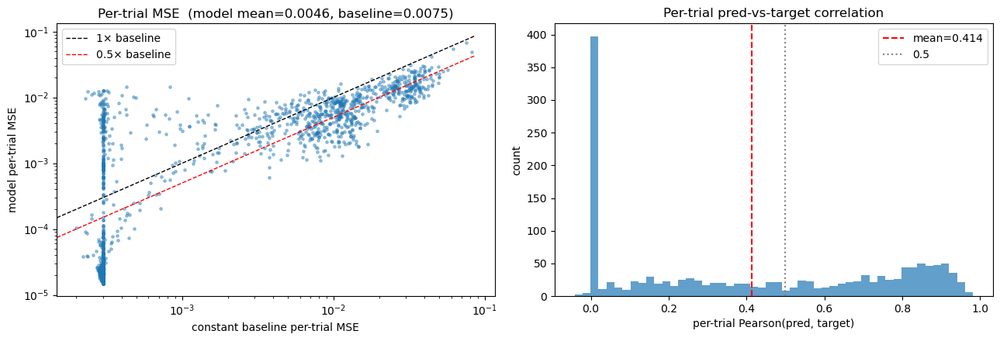

In [6]:
fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))
ax = axes[0]
ax.scatter(baseline_per_trial, per_trial_mse, s=6, alpha=0.4)
lim = max(baseline_per_trial.max(), per_trial_mse.max()) * 1.05
ax.plot([0, lim], [0, lim], 'k--', lw=1, label='1× baseline')
ax.plot([0, lim], [0, lim*0.5], 'r--', lw=1, label='0.5× baseline')
ax.set_xlabel('constant baseline per-trial MSE')
ax.set_ylabel('model per-trial MSE')
ax.set_title(f'Per-trial MSE  (model mean={per_trial_mse.mean():.4f}, baseline={baseline_per_trial.mean():.4f})')
ax.legend()
ax.set_xscale('log'); ax.set_yscale('log')

ax = axes[1]
ax.hist(pearson, bins=50, color='C0', alpha=0.7)
ax.axvline(pearson.mean(), color='red', linestyle='--', label=f'mean={pearson.mean():.3f}')
ax.axvline(0.5, color='grey', linestyle=':', label='0.5')
ax.set_xlabel('per-trial Pearson(pred, target)')
ax.set_ylabel('count')
ax.set_title('Per-trial pred-vs-target correlation')
ax.legend()
plt.tight_layout()

## Qualitative gallery

Best / median / worst trials by per-trial MSE. Each row: RGB · target heatmap overlay · predicted heatmap overlay · signed difference (red = under-predicted, blue = over-predicted).

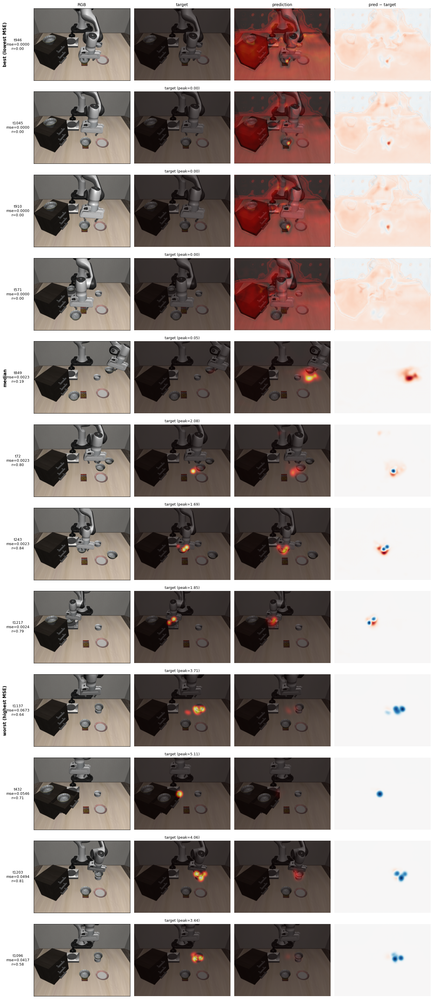

In [7]:
def gallery_row(axes, idx, vmax_shared=None):
    rgb = rgbs_disp[idx]
    tgt = targets[idx]
    prd = preds[idx]
    diff = prd - tgt
    vmax = vmax_shared if vmax_shared is not None else max(tgt.max(), prd.max(), 1e-3)
    dlim = max(abs(diff.min()), abs(diff.max()), 1e-3)

    axes[0].imshow(rgb)
    axes[0].set_ylabel(f't{idx}\nmse={per_trial_mse[idx]:.4f}\nr={pearson[idx]:.2f}',
                       fontsize=9, rotation=0, labelpad=40, va='center')
    axes[0].set_xticks([]); axes[0].set_yticks([])

    axes[1].imshow(rgb)
    axes[1].imshow(tgt, cmap='hot', alpha=0.55, vmin=0, vmax=vmax)
    axes[1].axis('off')
    axes[1].set_title(f'target (peak={tgt.max():.2f})' if axes[1].get_title() == '' else '', fontsize=9)

    axes[2].imshow(rgb)
    axes[2].imshow(prd, cmap='hot', alpha=0.55, vmin=0, vmax=vmax)
    axes[2].axis('off')

    axes[3].imshow(diff, cmap='RdBu_r', vmin=-dlim, vmax=dlim)
    axes[3].axis('off')


order = np.argsort(per_trial_mse)
best = order[:4]
worst = order[-4:][::-1]
med_lo, med_hi = len(order) // 2 - 2, len(order) // 2 + 2
median = order[med_lo:med_hi]
groups = [('best (lowest MSE)', best), ('median', median), ('worst (highest MSE)', worst)]

n_rows = sum(len(g[1]) for g in groups)
fig, axes = plt.subplots(n_rows, 4, figsize=(15, 2.9 * n_rows), squeeze=False)
row = 0
for label, idxs in groups:
    for i in idxs:
        gallery_row(axes[row], i)
        if row == 0 and i == idxs[0]:
            axes[row, 0].set_title('RGB', fontsize=10)
            axes[row, 1].set_title('target', fontsize=10)
            axes[row, 2].set_title('prediction', fontsize=10)
            axes[row, 3].set_title('pred − target', fontsize=10)
        if i == idxs[0]:
            axes[row, 0].text(-0.3, 0.5, label, transform=axes[row, 0].transAxes,
                              fontsize=11, fontweight='bold', rotation=90,
                              ha='center', va='center')
        row += 1
plt.tight_layout()

## Per-region Spearman

Bin the image into a coarse 6×8 macroblock grid, sum the mass in each block, and compute Spearman correlation between predicted and target across (trial × block) pairs. This tests whether the model ranks regions correctly — a robust signal for spatial structure that's less brittle than per-pixel MSE.

It's also the same shape as the eventual per-entity risk score the planner consumes.

/tmp/ipykernel_1915540/673744543.py:16: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearmanr(pred_blocks[i], tgt_blocks[i]).statistic


Per-trial block Spearman  mean=0.425  median=0.440
  fraction > 0.5: 16.13%
  fraction > 0.7: 0.00%

Global block Spearman (all trials × all blocks): 0.362


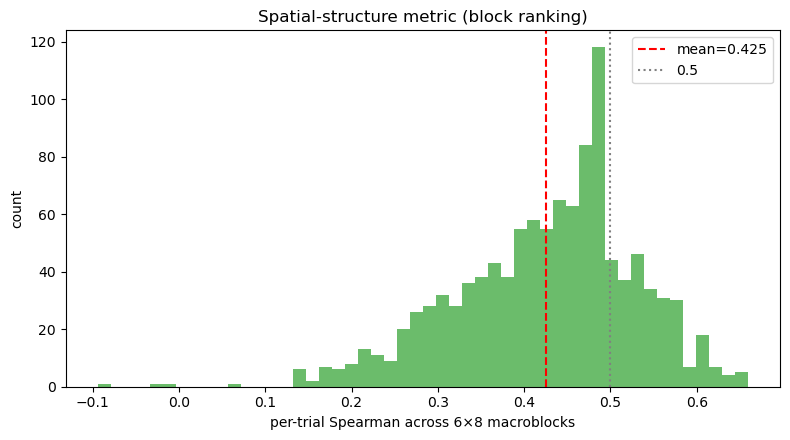

In [8]:
from scipy.stats import spearmanr

def block_sum(arr, gh=6, gw=8):
    """Sum (N, H, W) over gh × gw macroblocks → (N, gh, gw)."""
    N, H, W = arr.shape
    bh, bw = H // gh, W // gw
    cropped = arr[:, :gh*bh, :gw*bw]
    return cropped.reshape(N, gh, bh, gw, bw).sum(axis=(2, 4))

GH, GW = 6, 8
pred_blocks = block_sum(preds, GH, GW).reshape(len(preds), -1)
tgt_blocks = block_sum(targets, GH, GW).reshape(len(targets), -1)

# Per-trial Spearman across blocks.
per_trial_spearman = np.array([
    spearmanr(pred_blocks[i], tgt_blocks[i]).statistic
    for i in range(len(preds))
])
print(f'Per-trial block Spearman  mean={np.nanmean(per_trial_spearman):.3f}  '
      f'median={np.nanmedian(per_trial_spearman):.3f}')
print(f'  fraction > 0.5: {(per_trial_spearman > 0.5).mean():.2%}')
print(f'  fraction > 0.7: {(per_trial_spearman > 0.7).mean():.2%}')

# Global Spearman across all (trial, block) pairs.
global_rho, _ = spearmanr(pred_blocks.ravel(), tgt_blocks.ravel())
print(f'\nGlobal block Spearman (all trials × all blocks): {global_rho:.3f}')

fig, ax = plt.subplots(figsize=(8, 4.5))
ax.hist(per_trial_spearman, bins=50, color='C2', alpha=0.7)
ax.axvline(np.nanmean(per_trial_spearman), color='red', linestyle='--',
           label=f'mean={np.nanmean(per_trial_spearman):.3f}')
ax.axvline(0.5, color='grey', linestyle=':', label='0.5')
ax.set_xlabel(f'per-trial Spearman across {GH}×{GW} macroblocks')
ax.set_ylabel('count')
ax.set_title('Spatial-structure metric (block ranking)')
ax.legend()
plt.tight_layout()

## Loss curve from training

For reference — replays `metrics.csv` so we can see the val curve alongside the eval result on `best.pt`.

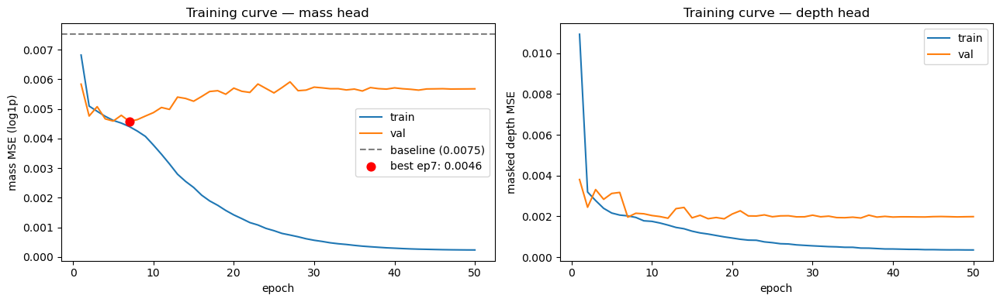

In [9]:
metrics = pd.read_csv(RUN_DIR / 'metrics.csv')
fig, axes = plt.subplots(1, 2, figsize=(13, 4))
ax = axes[0]
ax.plot(metrics.epoch, metrics.train_mass, label='train', color='C0')
ax.plot(metrics.epoch, metrics.val_mass, label='val', color='C1')
ax.axhline(config['baseline_val_mass_mse'], ls='--', color='grey',
           label=f"baseline ({config['baseline_val_mass_mse']:.4f})")
best_ep = int(metrics.val_mass.idxmin()) + 1
best_val = metrics.val_mass.min()
ax.scatter([best_ep], [best_val], color='red', s=60, zorder=5,
           label=f'best ep{best_ep}: {best_val:.4f}')
ax.set_xlabel('epoch')
ax.set_ylabel('mass MSE (log1p)')
ax.set_title('Training curve — mass head')
ax.legend()

ax = axes[1]
ax.plot(metrics.epoch, metrics.train_depth, label='train', color='C0')
ax.plot(metrics.epoch, metrics.val_depth, label='val', color='C1')
ax.set_xlabel('epoch')
ax.set_ylabel('masked depth MSE')
ax.set_title('Training curve — depth head')
ax.legend()
plt.tight_layout()

## Summary

Quick verdict from the metrics above — interpret in context:

- **mass MSE vs baseline** below 70% = the model is doing real work; below 50% = strong.
- **Per-trial Pearson** > 0.5 = the model is correlated with the truth on most trials.
- **Per-trial block Spearman** > 0.5 = the model ranks regions correctly — the strongest planner-relevant signal at this prototype stage.
- **Peak localization** < 32 px (~1 grid cell at 240×320) = the model finds the most-likely-contact spot.
- **Worst-case trials** in the gallery — look for systematic failure modes (e.g., always misses cabinet-interior contacts? confuses table-front vs table-back?). These motivate the next ablation.

## Round-5 diagnostic: does `is_holding` actually help?

Two diagnostics, only meaningful when the loaded checkpoint has `USE_HOLDING=True`:

1. **Split per-trial metrics by `is_holding`**. If the bit is useful, the gap between model and baseline should be larger on at least one of the two subsets.
2. **Compare against the previous Round-3 baseline** (no holding) if its checkpoint is on disk. Pick whichever earlier run had `use_holding=False`.

In [10]:
# 1) Per-trial MSE split by is_holding.
if USE_HOLDING:
    rows = []
    for label, mask in [('all', np.ones_like(is_holdings, dtype=bool)),
                        ('is_holding=0', is_holdings == 0),
                        ('is_holding=1', is_holdings == 1)]:
        n = int(mask.sum())
        if n == 0:
            continue
        m_mse = per_trial_mse[mask].mean()
        b_mse = baseline_per_trial[mask].mean()
        rows.append(dict(subset=label, n=n,
                         model_mse=m_mse, baseline_mse=b_mse,
                         vs_baseline=m_mse / b_mse))
    print(pd.DataFrame(rows).round({'model_mse': 5, 'baseline_mse': 5, 'vs_baseline': 3}).to_string(index=False))
else:
    print('Loaded checkpoint was trained without is_holding; per-holding split is uninformative.')

      subset    n  model_mse  baseline_mse  vs_baseline
         all 1500    0.00458       0.00752        0.609
is_holding=0  624    0.00409       0.00634        0.644
is_holding=1  876    0.00493       0.00836        0.589


In [11]:
# 2) Three-way comparison (R3 vs R5 vs R6). Skipped under per_trial=True because
#    R3/R5/R6 were trained against aggregated labels — comparing their predictions
#    to per-trial targets isn't apples-to-apples.
if ds_per_trial:
    print('skipping R3/R5/R6 comparison: current run uses per_trial labels '
          '(different target semantics from prior runs)')
    bpreds = None
    r5_preds = None
    r6_preds = None
else:
    def _classify_run(run_dir):
        try:
            cfg = json.loads((run_dir / 'config.json').read_text())
            sd = torch.load(run_dir / 'best.pt', map_location='cpu', weights_only=False)['model']
        except Exception:
            return None
        uh, m, _ = _detect_holding_mode(sd, cfg)
        return uh, m

    prior_runs = sorted(Path('runs').glob('libero_*'))
    prior_runs = [p for p in prior_runs if (p / 'best.pt').exists()]
    runs_by_kind = {('none', 'bottleneck'): None, (True, 'bottleneck'): None, (True, 'film'): None}
    labels_by_kind = {('none', 'bottleneck'): 'R3 (no holding)',
                      (True, 'bottleneck'): 'R5 (bottleneck)',
                      (True, 'film'): 'R6 (FiLM)'}
    for p in reversed(prior_runs):
        info = _classify_run(p)
        if info is None:
            continue
        uh, m = info
        # Skip per_trial-trained runs — their targets aren't comparable here.
        try:
            cfg_p = json.loads((p / 'config.json').read_text())
            if cfg_p.get('per_trial', False):
                continue
        except Exception:
            pass
        key = ('none', 'bottleneck') if not uh else (True, m)
        if runs_by_kind.get(key) is None:
            runs_by_kind[key] = p

    print('selected runs:')
    for k, p in runs_by_kind.items():
        print(f'  {labels_by_kind[k]:25s}  {p}')

    def _run_inference(run_dir, ds, val_idx, batch_size=16):
        cfg = json.loads((run_dir / 'config.json').read_text())
        sd = torch.load(run_dir / 'best.pt', map_location=device, weights_only=False)['model']
        uh, mode, ufm = _detect_holding_mode(sd, cfg)
        us = bool(cfg.get('use_state', False))
        m = LiberoHeatmapModel(use_state=us, use_holding=uh, holding_mode=mode,
                               use_failure_mode=ufm,
                               n_failure_modes=getattr(ds, 'n_failure_modes', 5)).to(device)
        m.load_state_dict(sd)
        m.eval()
        loader_local = DataLoader(Subset(ds, val_idx), batch_size=batch_size, num_workers=2, shuffle=False)
        out_preds = []
        with torch.no_grad():
            for batch in loader_local:
                rgb_b = batch['rgb'].to(device)
                depth_b = batch['depth'].to(device)
                state_b = batch['state'].to(device) if us else None
                hold_b = batch['is_holding'].to(device) if uh else None
                fo = batch['failure_onehot'].to(device) if ufm and 'failure_onehot' in batch else None
                o = m(rgb_b, depth_b, state=state_b, is_holding=hold_b, failure_onehot=fo)['mass']
                out_preds.append(o.cpu().numpy()[:, 0])
        return np.concatenate(out_preds)

    preds_by_kind = {}
    for k, p in runs_by_kind.items():
        if p is None:
            continue
        if p == RUN_DIR:
            preds_by_kind[k] = preds
        else:
            print(f'running inference: {labels_by_kind[k]}')
            preds_by_kind[k] = _run_inference(p, ds, val_idx)

    rows = []
    for label, mask in [('all', np.ones_like(is_holdings, dtype=bool)),
                        ('is_holding=0', is_holdings == 0),
                        ('is_holding=1', is_holdings == 1)]:
        n = int(mask.sum())
        if n == 0:
            continue
        r = dict(subset=label, n=n, const_mse=baseline_per_trial[mask].mean())
        for kind, p_pred in preds_by_kind.items():
            col = f"{labels_by_kind[kind].split()[0]}_mse"
            r[col] = ((p_pred[mask] - targets[mask]) ** 2).mean(axis=(1, 2)).mean()
        rows.append(r)
    df_3way = pd.DataFrame(rows).round(5)
    print(df_3way.to_string(index=False))

    bpreds = preds_by_kind.get(('none', 'bottleneck'))
    r5_preds = preds_by_kind.get((True, 'bottleneck'))
    r6_preds = preds_by_kind.get((True, 'film'))

skipping R3/R5/R6 comparison: current run uses per_trial labels (different target semantics from prior runs)


## Round-7 diagnostic: per-(failure_mode × is_holding) breakdown + flip-sensitivity

Only meaningful when `USE_FAILURE_MODE=True` and the dataset is per-trial.

In [12]:
if not (USE_FAILURE_MODE and ds_per_trial and failure_mode_ids is not None):
    print('skipping per-(failure_mode, is_holding) breakdown: needs per_trial + use_failure_mode')
else:
    fm_names = ds.failure_mode_names
    rows = []
    for f_id, f_name in enumerate(fm_names):
        for h in (0, 1):
            mask = (failure_mode_ids == f_id) & (is_holdings == h)
            n = int(mask.sum())
            if n == 0:
                continue
            m_mse = float(((preds[mask] - targets[mask]) ** 2).mean(axis=(1, 2)).mean())
            t_total_mean = float(targets[mask].sum(axis=(1, 2)).mean())
            t_total_lt1 = float((targets[mask].sum(axis=(1, 2)) < 1.0).mean())
            rows.append(dict(
                failure_mode=str(f_name), is_holding=h, n=n,
                model_mse=m_mse,
                tgt_total_mean=t_total_mean,
                tgt_zero_rate=t_total_lt1,
            ))
    breakdown = pd.DataFrame(rows).round({'model_mse': 5, 'tgt_total_mean': 2, 'tgt_zero_rate': 3})
    print('Per-(failure_mode, is_holding) val MSE for R7:')
    print(breakdown.to_string(index=False))
    print()
    n_det = breakdown[(breakdown.tgt_zero_rate > 0.8)]
    if not n_det.empty:
        print(f'On the {len(n_det)} near-deterministic classes (tgt_zero_rate > 0.8),')
        print(f'  mean model_mse = {n_det.model_mse.mean():.5f}')
        print(f'  these classes have target mass total < 1 in >80% of trials,')
        print(f'  so model should predict ~0 there.')


# Failure-mode flip-sensitivity: how much does prediction change when we
# swap one failure mode for another on the same trial?
if USE_FAILURE_MODE:
    print('\nFailure-mode flip-sensitivity (R7):')
    flip_diffs = []
    with torch.no_grad():
        for batch in loader:
            rgb_b = batch['rgb'].to(device)
            depth_b = batch['depth'].to(device)
            hold_b = batch['is_holding'].to(device) if USE_HOLDING else None
            B = rgb_b.shape[0]
            # Flip: GRIPPER_OPEN (id=0) vs ALL_JOINTS (id=3) one-hot
            oh_a = torch.zeros(B, ds.n_failure_modes, device=device)
            oh_a[:, 0] = 1
            oh_b = torch.zeros(B, ds.n_failure_modes, device=device)
            oh_b[:, 3] = 1
            o_a = model(rgb_b, depth_b, state=None, is_holding=hold_b, failure_onehot=oh_a)['mass']
            o_b = model(rgb_b, depth_b, state=None, is_holding=hold_b, failure_onehot=oh_b)['mass']
            flip_diffs.append(((o_b - o_a) ** 2).mean(dim=(1, 2, 3)).sqrt().cpu().numpy())
    flip_diffs = np.concatenate(flip_diffs)
    print(f'  per-trial L2 change from flipping GRIPPER_OPEN -> ALL_JOINTS:')
    print(f'    mean={flip_diffs.mean():.4f}  median={np.median(flip_diffs):.4f}  '
          f'max={flip_diffs.max():.4f}')
    print(f'  (target peaks ~1.0; >0.3 means the model is genuinely using failure_mode)')

Per-(failure_mode, is_holding) val MSE for R7:
 failure_mode  is_holding   n  model_mse  tgt_total_mean  tgt_zero_rate
 GRIPPER_OPEN           0 159    0.00005            5.11          0.956
 GRIPPER_OPEN           1 212    0.00035           45.83          0.193
 SINGLE_JOINT           0 264    0.00778          633.53          0.367
 SINGLE_JOINT           1 379    0.00942          908.46          0.000
  MULTI_JOINT           0  59    0.00374          505.08          0.119
  MULTI_JOINT           1  80    0.00378          675.58          0.000
   ALL_JOINTS           0  44    0.00602          777.06          0.000
   ALL_JOINTS           1  70    0.00489         1053.68          0.000
SLIPPERY_GRIP           0  98    0.00004            6.50          0.929
SLIPPERY_GRIP           1 135    0.00021           31.30          0.244

On the 2 near-deterministic classes (tgt_zero_rate > 0.8),
  mean model_mse = 0.00005
  these classes have target mass total < 1 in >80% of trials,
  so model s

  per-trial L2 change from flipping GRIPPER_OPEN -> ALL_JOINTS:
    mean=0.0777  median=0.0784  max=0.1399
  (target peaks ~1.0; >0.3 means the model is genuinely using failure_mode)


## R7 failure-mode sweep

For a handful of val trials, force the model through **all 5 failure modes** at the same `is_holding` state and visualise how the prediction changes. This is the load-bearing visualisation that the model is genuinely conditioning on `failure_mode`.

Two rows per holding state. Layout: RGB + true target (col 0), then one prediction column per failure mode (cols 1–5). The bottom row of each block also shows the diff between adjacent failure modes (red = right column hotter).


Per-trial L2 between adjacent failure-mode predictions (selected trials):
 trial  h         true  GRIvsSIN  GRIvsMUL  GRIvsALL  GRIvsSLI  SINvsMUL  SINvsALL  SINvsSLI  MULvsALL  MULvsSLI  ALLvsSLI
  1178  0 GRIPPER_OPEN    0.0352    0.0238    0.0553    0.0013    0.0119    0.0208    0.0352    0.0320    0.0238    0.0553
  1137  0 SINGLE_JOINT    0.0314    0.0206    0.0568    0.0013    0.0115    0.0293    0.0313    0.0371    0.0206    0.0568
   690  1 GRIPPER_OPEN    0.0830    0.0553    0.0860    0.0016    0.0280    0.0101    0.0843    0.0318    0.0566    0.0874
  1113  1 SINGLE_JOINT    0.0606    0.0409    0.0749    0.0013    0.0202    0.0254    0.0616    0.0370    0.0420    0.0759


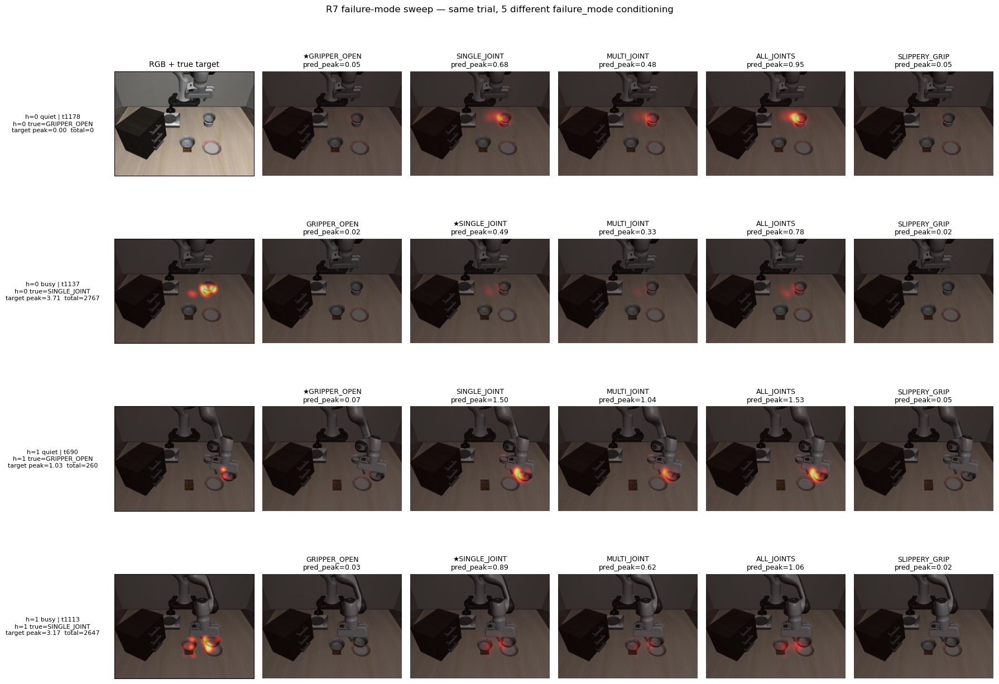

In [13]:
if not (USE_FAILURE_MODE and ds_per_trial):
    print('skipping failure-mode sweep: needs per_trial + use_failure_mode')
else:
    fm_names = ds.failure_mode_names
    n_modes = len(fm_names)

    # Pick 2 trials per holding state: one with target_total in the
    # near-zero range (gripper / no holding regime) and one busy joint trial
    # so the sweep shows both extremes.
    target_total = targets.sum(axis=(1, 2))

    def pick_trials(h_val):
        idx = np.where(is_holdings == h_val)[0]
        # 1 quiet trial (low target_total, but with some contact present)
        # 1 high-mass trial.
        order = np.argsort(target_total[idx])
        quiet = idx[order[max(0, len(order)//2 - 1)]]   # median-quiet
        busy = idx[order[-1]]                             # peak
        return [int(quiet), int(busy)]

    picks = pick_trials(0) + pick_trials(1)
    labels_row = ['h=0 quiet', 'h=0 busy', 'h=1 quiet', 'h=1 busy']

    n_rows = len(picks)
    fig, axes = plt.subplots(n_rows, 1 + n_modes, figsize=(3 * (1 + n_modes), 3.2 * n_rows),
                              squeeze=False)
    for r, i in enumerate(picks):
        tgt = targets[i]
        # Pre-compute sweep predictions for this trial.
        sweep_preds = []
        with torch.no_grad():
            item = ds[val_idx[i]]
            rgb_t = item['rgb'].unsqueeze(0).to(device)
            depth_t = item['depth'].unsqueeze(0).to(device)
            hold_t = item['is_holding'].unsqueeze(0).to(device) if USE_HOLDING else None
            for fm_i in range(n_modes):
                oh = torch.zeros(1, n_modes, device=device)
                oh[0, fm_i] = 1.0
                out = model(rgb_t, depth_t, state=None,
                            is_holding=hold_t, failure_onehot=oh)
                sweep_preds.append(out['mass'].cpu().numpy()[0, 0])
        v = max(tgt.max(), max(p.max() for p in sweep_preds), 1e-3)

        # Col 0: RGB + true target
        axes[r, 0].imshow(rgbs_disp[i])
        if tgt.max() > 0:
            axes[r, 0].imshow(tgt, cmap='hot', alpha=0.55, vmin=0, vmax=v)
        true_fm = fm_names[failure_mode_ids[i]]
        axes[r, 0].set_ylabel(
            f"{labels_row[r]} | t{i}\nh={is_holdings[i]} true={true_fm}\n"
            f"target peak={tgt.max():.2f}  total={target_total[i]:.0f}",
            fontsize=8, rotation=0, labelpad=80, va='center')
        axes[r, 0].set_xticks([]); axes[r, 0].set_yticks([])
        if r == 0:
            axes[r, 0].set_title('RGB + true target', fontsize=10)

        # Cols 1..5: one prediction per failure mode
        for fm_i, fm_n in enumerate(fm_names):
            ax = axes[r, 1 + fm_i]
            ax.imshow(rgbs_disp[i])
            pred = sweep_preds[fm_i]
            if pred.max() > 0:
                ax.imshow(pred, cmap='hot', alpha=0.55, vmin=0, vmax=v)
            mark = '★' if fm_i == failure_mode_ids[i] else ''
            ax.set_title(f"{mark}{fm_n}\npred_peak={pred.max():.2f}", fontsize=9)
            ax.axis('off')

    plt.suptitle('R7 failure-mode sweep — same trial, 5 different failure_mode conditioning',
                 y=1.005)
    plt.tight_layout()

    # Quantitative: per-trial L2 between predictions for adjacent failure-mode pairs.
    print('\nPer-trial L2 between adjacent failure-mode predictions (selected trials):')
    rows_sw = []
    for r, i in enumerate(picks):
        item = ds[val_idx[i]]
        rgb_t = item['rgb'].unsqueeze(0).to(device)
        depth_t = item['depth'].unsqueeze(0).to(device)
        hold_t = item['is_holding'].unsqueeze(0).to(device) if USE_HOLDING else None
        ps = []
        with torch.no_grad():
            for fm_i in range(n_modes):
                oh = torch.zeros(1, n_modes, device=device)
                oh[0, fm_i] = 1.0
                p = model(rgb_t, depth_t, state=None,
                          is_holding=hold_t, failure_onehot=oh)['mass'].cpu().numpy()[0, 0]
                ps.append(p)
        row = {'trial': i, 'h': int(is_holdings[i]), 'true': str(fm_names[failure_mode_ids[i]])}
        for a in range(n_modes):
            for b in range(a+1, n_modes):
                key = f"{fm_names[a][:3]}vs{fm_names[b][:3]}"
                row[key] = float(np.sqrt(((ps[a] - ps[b]) ** 2).mean()))
        rows_sw.append(row)
    print(pd.DataFrame(rows_sw).round(4).to_string(index=False))

## R6 vs R7 — same val trials, two models

R6 was trained against *aggregated* labels (predict the expectation over failure modes); R7 was trained against *per-trial* labels with `failure_mode` as input (predict the specific failure's contact pattern).

Comparing them on the per-trial val set is unfair to R6 by construction — it never saw the specific failure. But it's the right comparison for "does conditioning on failure_mode actually buy something?"

Layout: 10 rows (one per failure_mode × is_holding present in val), 4 cols. Cols: RGB+target | RGB+R6_pred | RGB+R7_pred | R7−R6 signed diff.

comparing current R7 (libero_20260512_205644_r7) against R6 (libero_20260512_185634_film)


R6 val mass-MSE (against per-trial targets): 0.00621
R7 val mass-MSE (against per-trial targets): 0.00458


 failure_mode  is_holding   n  r6_mse  r7_mse  r7_vs_r6
 GRIPPER_OPEN           0 159 0.00168 0.00005     0.027
 GRIPPER_OPEN           1 212 0.00275 0.00035     0.128
 SINGLE_JOINT           0 264 0.00847 0.00778     0.918
 SINGLE_JOINT           1 379 0.01097 0.00942     0.859
  MULTI_JOINT           0  59 0.00381 0.00374     0.982
  MULTI_JOINT           1  80 0.00468 0.00378     0.808
   ALL_JOINTS           0  44 0.00782 0.00602     0.770
   ALL_JOINTS           1  70 0.00790 0.00489     0.619
SLIPPERY_GRIP           0  98 0.00191 0.00004     0.019
SLIPPERY_GRIP           1 135 0.00287 0.00021     0.072

R7 beats R6 on 10/10 (failure_mode × is_holding) classes.


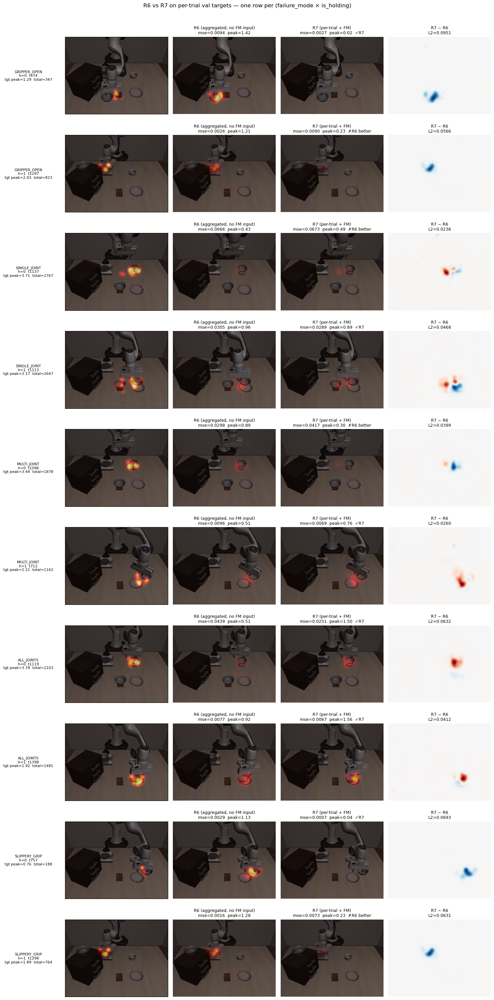

In [14]:
# Find an R6-style run: use_holding + holding_mode=film + NOT per_trial.
r6_run = None
for p in sorted(Path('runs').glob('libero_*'), reverse=True):
    if p == RUN_DIR or not (p / 'best.pt').exists():
        continue
    try:
        cfg_p = json.loads((p / 'config.json').read_text())
    except Exception:
        continue
    if cfg_p.get('per_trial', False):
        continue
    sd_p = torch.load(p / 'best.pt', map_location='cpu', weights_only=False)['model']
    uh, mode, ufm = _detect_holding_mode(sd_p, cfg_p)
    if uh and mode == 'film' and not ufm:
        r6_run = p
        break

if r6_run is None:
    print('no R6-style run found (use_holding + film + not per_trial). Skipping comparison.')
elif not (USE_FAILURE_MODE and ds_per_trial):
    print('current run is not R7-style (need per_trial + use_failure_mode). Skipping.')
else:
    print(f'comparing current R7 ({RUN_DIR.name}) against R6 ({r6_run.name})')

    # Load R6
    r6_cfg = json.loads((r6_run / 'config.json').read_text())
    r6_sd = torch.load(r6_run / 'best.pt', map_location=device, weights_only=False)['model']
    r6_model = LiberoHeatmapModel(
        use_state=bool(r6_cfg.get('use_state', False)),
        use_holding=True, holding_mode='film',
        use_failure_mode=False,
        n_failure_modes=ds.n_failure_modes,
    ).to(device)
    r6_model.load_state_dict(r6_sd)
    r6_model.eval()

    # Run R6 inference on the per-trial val set.
    r6_preds_list = []
    with torch.no_grad():
        for batch in loader:
            rgb_b = batch['rgb'].to(device)
            depth_b = batch['depth'].to(device)
            hold_b = batch['is_holding'].to(device)
            o = r6_model(rgb_b, depth_b, state=None, is_holding=hold_b, failure_onehot=None)['mass']
            r6_preds_list.append(o.cpu().numpy()[:, 0])
    r6_preds_arr = np.concatenate(r6_preds_list)

    # Aggregate-style MSE on the per-trial targets (a fair number for R6).
    r6_mse_per_trial = ((r6_preds_arr - targets) ** 2).mean(axis=(1, 2))
    print(f'R6 val mass-MSE (against per-trial targets): {r6_mse_per_trial.mean():.5f}')
    print(f'R7 val mass-MSE (against per-trial targets): {per_trial_mse.mean():.5f}')

    # Pick one representative trial per (failure_mode, is_holding) bucket;
    # prefer high-target-total trials so there's something to show.
    fm_names = list(ds.failure_mode_names)
    n_modes = len(fm_names)
    target_total = targets.sum(axis=(1, 2))
    picks = []
    for f_id in range(n_modes):
        for h in (0, 1):
            mask = (failure_mode_ids == f_id) & (is_holdings == h)
            idxs = np.where(mask)[0]
            if idxs.size == 0:
                continue
            chosen = idxs[np.argmax(target_total[idxs])]
            picks.append(int(chosen))

    n_rows = len(picks)
    fig, axes = plt.subplots(n_rows, 4, figsize=(15, 3.0 * n_rows), squeeze=False)
    for r, i in enumerate(picks):
        tgt = targets[i]
        r6_p = r6_preds_arr[i]
        r7_p = preds[i]
        v = max(tgt.max(), r6_p.max(), r7_p.max(), 1e-3)
        fm_name = fm_names[failure_mode_ids[i]]

        axes[r, 0].imshow(rgbs_disp[i])
        if tgt.max() > 0:
            axes[r, 0].imshow(tgt, cmap='hot', alpha=0.55, vmin=0, vmax=v)
        axes[r, 0].set_ylabel(
            f'{fm_name}\nh={is_holdings[i]}  t{i}\n'
            f'tgt peak={tgt.max():.2f}  total={target_total[i]:.0f}',
            fontsize=8, rotation=0, labelpad=80, va='center')
        axes[r, 0].set_xticks([]); axes[r, 0].set_yticks([])

        axes[r, 1].imshow(rgbs_disp[i])
        if r6_p.max() > 0:
            axes[r, 1].imshow(r6_p, cmap='hot', alpha=0.55, vmin=0, vmax=v)
        axes[r, 1].set_title(
            f'R6 (aggregated, no FM input)\nmse={r6_mse_per_trial[i]:.4f}  peak={r6_p.max():.2f}',
            fontsize=9)
        axes[r, 1].axis('off')

        axes[r, 2].imshow(rgbs_disp[i])
        if r7_p.max() > 0:
            axes[r, 2].imshow(r7_p, cmap='hot', alpha=0.55, vmin=0, vmax=v)
        winner = '✓R7' if per_trial_mse[i] < r6_mse_per_trial[i] else '✗R6 better'
        axes[r, 2].set_title(
            f'R7 (per-trial + FM)\nmse={per_trial_mse[i]:.4f}  peak={r7_p.max():.2f}  {winner}',
            fontsize=9)
        axes[r, 2].axis('off')

        diff = r7_p - r6_p
        dlim = max(abs(diff.min()), abs(diff.max()), 1e-3)
        axes[r, 3].imshow(diff, cmap='RdBu_r', vmin=-dlim, vmax=dlim)
        axes[r, 3].set_title(f'R7 − R6\nL2={np.sqrt((diff**2).mean()):.4f}', fontsize=9)
        axes[r, 3].axis('off')

    if r == 0:
        axes[0, 0].set_title('RGB + target', fontsize=10)
    plt.suptitle('R6 vs R7 on per-trial val targets — one row per (failure_mode × is_holding)',
                 y=1.005)
    plt.tight_layout()

    # Per-(failure_mode, is_holding) summary.
    rows = []
    for f_id in range(n_modes):
        for h in (0, 1):
            mask = (failure_mode_ids == f_id) & (is_holdings == h)
            n = int(mask.sum())
            if n == 0:
                continue
            r6_m = r6_mse_per_trial[mask].mean()
            r7_m = per_trial_mse[mask].mean()
            rows.append(dict(
                failure_mode=fm_names[f_id], is_holding=h, n=n,
                r6_mse=r6_m, r7_mse=r7_m, r7_vs_r6=r7_m / max(r6_m, 1e-9),
            ))
    print(pd.DataFrame(rows).round({'r6_mse': 5, 'r7_mse': 5, 'r7_vs_r6': 3}).to_string(index=False))
    wins = sum(1 for r in rows if r['r7_vs_r6'] < 1.0)
    print(f'\nR7 beats R6 on {wins}/{len(rows)} (failure_mode × is_holding) classes.')

## Holding-aware visualizations

Three views to actually *see* what the holding bit does (or doesn't do):

1. **Stratified gallery** — best/worst trials for `is_holding=0` and `is_holding=1` separately.
2. **R3 vs R5 side-by-side** — same trials run through both checkpoints; difference reveals where the holding bit shifts predictions.
3. **Holding-flip sensitivity** — feed `is_holding=0` and `is_holding=1` to the same model on the same trial. Pure isolation of the bit's effect.

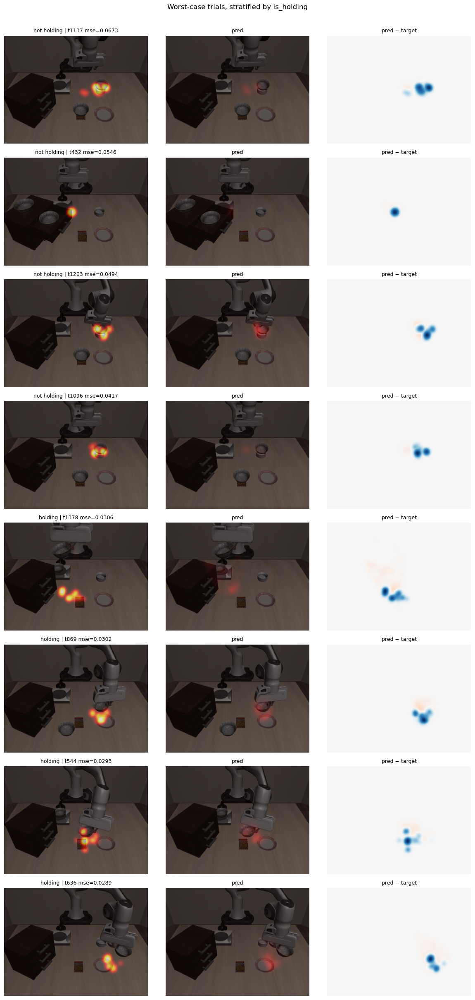

In [15]:
# 1) Stratified gallery — worst-case rows for holding=0 and holding=1 separately.
def overlay(ax, rgb, heat, title=None, vmax=None, cmap='hot'):
    ax.imshow(rgb)
    if heat is not None and heat.max() > 0:
        ax.imshow(heat, cmap=cmap, alpha=0.55, vmin=0, vmax=vmax if vmax else heat.max())
    if title:
        ax.set_title(title, fontsize=9)
    ax.axis('off')

def stratified_rows(mask, label, n=4):
    """Pick n highest-MSE trials within mask."""
    idxs = np.where(mask)[0]
    if idxs.size == 0:
        return [], label
    order = idxs[np.argsort(-per_trial_mse[idxs])]
    return list(order[:n]), label

if USE_HOLDING:
    h0, _ = stratified_rows(is_holdings == 0, 'is_holding=0 (NOT holding)', n=4)
    h1, _ = stratified_rows(is_holdings == 1, 'is_holding=1 (holding)', n=4)
    rows_to_show = [('not holding', h0), ('holding', h1)]
    n_rows = sum(len(r[1]) for r in rows_to_show)
    fig, axes = plt.subplots(n_rows, 3, figsize=(12, 3.0 * n_rows), squeeze=False)
    r = 0
    for group_label, idxs in rows_to_show:
        for k, i in enumerate(idxs):
            v = max(targets[i].max(), preds[i].max(), 1e-3)
            overlay(axes[r, 0], rgbs_disp[i], targets[i],
                    f'{group_label} | t{i} mse={per_trial_mse[i]:.4f}', vmax=v)
            overlay(axes[r, 1], rgbs_disp[i], preds[i],
                    f'pred', vmax=v)
            dlim = max(abs((preds[i]-targets[i]).min()), abs((preds[i]-targets[i]).max()), 1e-3)
            axes[r, 2].imshow(preds[i] - targets[i], cmap='RdBu_r', vmin=-dlim, vmax=dlim)
            axes[r, 2].set_title('pred − target', fontsize=9)
            axes[r, 2].axis('off')
            r += 1
    plt.suptitle('Worst-case trials, stratified by is_holding', y=1.005)
    plt.tight_layout()
else:
    print('checkpoint has use_holding=False; stratified gallery is uninformative.')

In [16]:
# 2) R3 vs R5 side-by-side. Picks the trials where the two models disagree the most.
#    Requires the comparison cell above to have run (bpreds defined).
if not (USE_HOLDING and 'bpreds' in dir() and bpreds is not None):
    print('skipping R3 vs R5 (need both checkpoints loaded; run the comparison cell above first).')
else:
    # Disagreement = L2 between R3 and R5 predictions per trial.
    disagree = np.sqrt(((bpreds - preds) ** 2).mean(axis=(1, 2)))
    print(f'R3 vs R5 prediction disagreement  mean={disagree.mean():.4f}  '
          f'max={disagree.max():.4f}  median={np.median(disagree):.4f}')

    # Top-K trials by disagreement, balanced across holding states.
    top_k = 6
    idx_h0 = np.where(is_holdings == 0)[0]
    idx_h1 = np.where(is_holdings == 1)[0]
    sel_h0 = idx_h0[np.argsort(-disagree[idx_h0])][:top_k // 2]
    sel_h1 = idx_h1[np.argsort(-disagree[idx_h1])][:top_k // 2]
    sel = np.concatenate([sel_h0, sel_h1])

    fig, axes = plt.subplots(len(sel), 4, figsize=(15, 3.0 * len(sel)), squeeze=False)
    for r, i in enumerate(sel):
        v = max(targets[i].max(), preds[i].max(), bpreds[i].max(), 1e-3)
        overlay(axes[r, 0], rgbs_disp[i], targets[i],
                f'h={is_holdings[i]} | t{i}\ntarget (peak={targets[i].max():.2f})', vmax=v)
        overlay(axes[r, 1], rgbs_disp[i], bpreds[i],
                f'R3 (no holding)\nmse={((bpreds[i]-targets[i])**2).mean():.4f}', vmax=v)
        overlay(axes[r, 2], rgbs_disp[i], preds[i],
                f'R5 (holding)\nmse={per_trial_mse[i]:.4f}', vmax=v)
        diff = preds[i] - bpreds[i]
        dlim = max(abs(diff.min()), abs(diff.max()), 1e-3)
        axes[r, 3].imshow(diff, cmap='RdBu_r', vmin=-dlim, vmax=dlim)
        axes[r, 3].set_title(f'R5 − R3\n(red = R5 over)', fontsize=9)
        axes[r, 3].axis('off')
    plt.suptitle('R3 vs R5 — trials where the two models disagree most', y=1.005)
    plt.tight_layout()

skipping R3 vs R5 (need both checkpoints loaded; run the comparison cell above first).



Isolating bit influence on all val trials...


  per-trial L2 change from flipping is_holding:
    mean=0.00404  median=0.00329  max=0.02123
    (typical target peak is ~1; flip change of <0.01 means the model effectively ignores the bit)


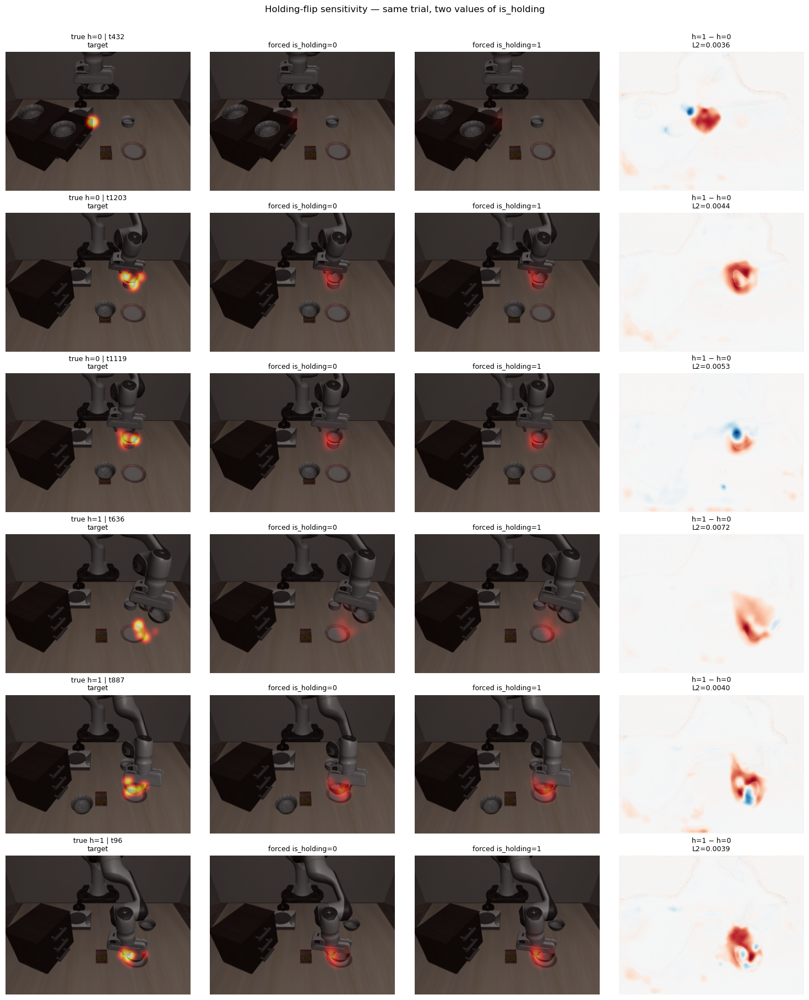

In [17]:
# 3) Holding-flip sensitivity: re-run R5/R6/R7 model with is_holding forced to 0 then 1
#    on the same trials. Isolates pure effect of the bit.
if USE_HOLDING:
    h0_idx = np.where(is_holdings == 0)[0]
    h1_idx = np.where(is_holdings == 1)[0]
    peaks = targets.max(axis=(1, 2))
    sel_h0 = h0_idx[np.argsort(-peaks[h0_idx])][:3]
    sel_h1 = h1_idx[np.argsort(-peaks[h1_idx])][:3]
    sel = np.concatenate([sel_h0, sel_h1])

    preds_h0_forced = np.zeros((len(sel),) + preds.shape[1:], dtype=np.float32)
    preds_h1_forced = np.zeros_like(preds_h0_forced)
    with torch.no_grad():
        for j, i in enumerate(sel):
            ds_item = ds[val_idx[i]]
            rgb_t = ds_item['rgb'].unsqueeze(0).to(device)
            depth_t = ds_item['depth'].unsqueeze(0).to(device)
            fo = (ds_item['failure_onehot'].unsqueeze(0).to(device)
                  if USE_FAILURE_MODE and 'failure_onehot' in ds_item else None)
            for flip_val, store in [(0.0, preds_h0_forced), (1.0, preds_h1_forced)]:
                h = torch.tensor([flip_val], device=device)
                out = model(rgb_t, depth_t, state=None, is_holding=h, failure_onehot=fo)
                store[j] = out['mass'].cpu().numpy()[0, 0]

    fig, axes = plt.subplots(len(sel), 4, figsize=(15, 3.0 * len(sel)), squeeze=False)
    for r, (j, i) in enumerate(zip(range(len(sel)), sel)):
        v = max(targets[i].max(), preds_h0_forced[j].max(), preds_h1_forced[j].max(), 1e-3)
        overlay(axes[r, 0], rgbs_disp[i], targets[i],
                f'true h={is_holdings[i]} | t{i}\ntarget', vmax=v)
        overlay(axes[r, 1], rgbs_disp[i], preds_h0_forced[j],
                'forced is_holding=0', vmax=v)
        overlay(axes[r, 2], rgbs_disp[i], preds_h1_forced[j],
                'forced is_holding=1', vmax=v)
        diff = preds_h1_forced[j] - preds_h0_forced[j]
        dlim = max(abs(diff.min()), abs(diff.max()), 1e-3)
        axes[r, 3].imshow(diff, cmap='RdBu_r', vmin=-dlim, vmax=dlim)
        axes[r, 3].set_title(f'h=1 − h=0\nL2={np.sqrt((diff**2).mean()):.4f}', fontsize=9)
        axes[r, 3].axis('off')
    plt.suptitle('Holding-flip sensitivity — same trial, two values of is_holding', y=1.005)
    plt.tight_layout()

    print('\nIsolating bit influence on all val trials...')
    flip_diffs = []
    with torch.no_grad():
        for batch in loader:
            rgb_b = batch['rgb'].to(device)
            depth_b = batch['depth'].to(device)
            fo = batch['failure_onehot'].to(device) if (USE_FAILURE_MODE and 'failure_onehot' in batch) else None
            o0 = model(rgb_b, depth_b, state=None,
                       is_holding=torch.zeros(rgb_b.shape[0], device=device),
                       failure_onehot=fo)['mass']
            o1 = model(rgb_b, depth_b, state=None,
                       is_holding=torch.ones(rgb_b.shape[0], device=device),
                       failure_onehot=fo)['mass']
            flip_diffs.append(((o1 - o0) ** 2).mean(dim=(1, 2, 3)).sqrt().cpu().numpy())
    flip_diffs = np.concatenate(flip_diffs)
    print(f'  per-trial L2 change from flipping is_holding:')
    print(f'    mean={flip_diffs.mean():.5f}  median={np.median(flip_diffs):.5f}  '
          f'max={flip_diffs.max():.5f}')
    print(f'    (typical target peak is ~1; flip change of <0.01 means the model '
          f'effectively ignores the bit)')
else:
    print('checkpoint has use_holding=False; flip sensitivity is uninformative.')

## "Robot fails" comparison gallery — target vs R3 vs R5

10 val trials where the post-failure rollout produced substantial contacts (ranked by total target mass), split into 5 not-holding and 5 holding. For each trial: target, R3 prediction (no holding), R5 prediction (with holding), and the R5−R3 difference.

The diff column is the load-bearing panel — it isolates where adding `is_holding` actually shifts predictions on the trials that matter most.

In [18]:
if not (USE_HOLDING and 'bpreds' in dir() and bpreds is not None):
    print('skipping: need R5 (use_holding) checkpoint loaded AND the R3 comparison cell above to have run.')
else:
    # Rank by total target mass within each holding subset, take top 5 each.
    target_total = targets.sum(axis=(1, 2))
    h0_idx = np.where(is_holdings == 0)[0]
    h1_idx = np.where(is_holdings == 1)[0]
    sel_h0 = h0_idx[np.argsort(-target_total[h0_idx])][:5]
    sel_h1 = h1_idx[np.argsort(-target_total[h1_idx])][:5]
    sel = np.concatenate([sel_h0, sel_h1])

    # Task labels for row titles (look up per-trial task from the manifest used above).
    tasks_sel = [manifest.loc[exp_ids[i], 'task'][:32] for i in sel]

    fig, axes = plt.subplots(len(sel), 4, figsize=(16, 3.2 * len(sel)), squeeze=False)
    for r, i in enumerate(sel):
        tgt = targets[i]
        r3 = bpreds[i]
        r5 = preds[i]
        v = max(tgt.max(), r3.max(), r5.max(), 1e-3)

        # Col 0: RGB + target
        axes[r, 0].imshow(rgbs_disp[i])
        if tgt.max() > 0:
            axes[r, 0].imshow(tgt, cmap='hot', alpha=0.55, vmin=0, vmax=v)
        axes[r, 0].set_ylabel(
            f"h={int(is_holdings[i])} | t{i}\n{tasks_sel[r]}\n"
            f"target peak={tgt.max():.2f}  total={target_total[i]:.0f}",
            fontsize=8, rotation=0, labelpad=70, va='center')
        axes[r, 0].set_xticks([]); axes[r, 0].set_yticks([])

        # Col 1: RGB + R3 prediction
        r3_mse = float(((r3 - tgt) ** 2).mean())
        axes[r, 1].imshow(rgbs_disp[i])
        if r3.max() > 0:
            axes[r, 1].imshow(r3, cmap='hot', alpha=0.55, vmin=0, vmax=v)
        axes[r, 1].set_title(f'R3 (no holding)\nmse={r3_mse:.4f}', fontsize=9)
        axes[r, 1].axis('off')

        # Col 2: RGB + R5 prediction
        r5_mse = float(per_trial_mse[i])
        axes[r, 2].imshow(rgbs_disp[i])
        if r5.max() > 0:
            axes[r, 2].imshow(r5, cmap='hot', alpha=0.55, vmin=0, vmax=v)
        winner = '✓R5' if r5_mse < r3_mse else '✗R3 better'
        axes[r, 2].set_title(f'R5 (holding)\nmse={r5_mse:.4f}  {winner}', fontsize=9)
        axes[r, 2].axis('off')

        # Col 3: R5 − R3 diff
        diff = r5 - r3
        dlim = max(abs(diff.min()), abs(diff.max()), 1e-3)
        axes[r, 3].imshow(diff, cmap='RdBu_r', vmin=-dlim, vmax=dlim)
        axes[r, 3].set_title(
            f'R5 − R3 (L2={np.sqrt((diff**2).mean()):.4f})\nred=R5 hotter, blue=R3 hotter',
            fontsize=9)
        axes[r, 3].axis('off')

    # Row-group labels via annotations on first column of each block.
    axes[0, 0].annotate('NOT HOLDING', xy=(-0.25, 1.05), xycoords='axes fraction',
                         fontsize=12, fontweight='bold', color='C0',
                         ha='left', va='bottom')
    axes[5, 0].annotate('HOLDING', xy=(-0.25, 1.05), xycoords='axes fraction',
                         fontsize=12, fontweight='bold', color='C3',
                         ha='left', va='bottom')

    plt.suptitle('"Robot fails" — 10 high-target-mass trials, target vs R3 vs R5', y=1.002)
    plt.tight_layout()

    # Compact summary table for the 10 selected trials.
    summary_rows = []
    for r, i in enumerate(sel):
        r3_mse = float(((bpreds[i] - targets[i]) ** 2).mean())
        r5_mse = float(per_trial_mse[i])
        summary_rows.append(dict(
            trial=int(i),
            is_holding=int(is_holdings[i]),
            target_total=float(target_total[i]),
            target_peak=float(targets[i].max()),
            r3_mse=r3_mse,
            r5_mse=r5_mse,
            r5_vs_r3=r5_mse / r3_mse,
        ))
    print(pd.DataFrame(summary_rows).round({
        'target_total': 1, 'target_peak': 3,
        'r3_mse': 5, 'r5_mse': 5, 'r5_vs_r3': 3,
    }).to_string(index=False))
    wins = sum(1 for r in summary_rows if r['r5_vs_r3'] < 1.0)
    print(f'\nR5 beats R3 on {wins}/{len(summary_rows)} of these high-impact trials.')

skipping: need R5 (use_holding) checkpoint loaded AND the R3 comparison cell above to have run.
